# Analise de dados
    Lembrando que df_year são uma média de todas as músicas que estavam dentro do Spotify naquele momento, não são daquela média que temos dentro das nossas músicas, então, é uma análise geral que vamos acabar fazendo.

In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv("data/Dados_totais.csv")
df_genres = pd.read_csv("data/data_by_genres.csv")
df_year = pd.read_csv("data/data_by_year.csv")

In [3]:
df.head(2)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,0,3AJwUDP919kvQ9QcozQPxg,0.000121,11,0.2340,-7.227,1,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,1,0I3q5fE6wg7LIfHGngUTnV,0.000000,4,0.0771,-5.946,0,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson


In [4]:
df['year'].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])

In [5]:
df.shape

(20311, 19)

In [6]:
# colunas que nao fazem sentido, podem ser retirados
df = df.drop(['explicit', 'key', 'mode'], axis=1)

In [7]:
df.shape

(20311, 16)

In [8]:
df.isnull().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
id                  0
instrumentalness    0
liveness            0
loudness            0
name                0
popularity          0
speechiness         0
tempo               0
artists_song        0
dtype: int64

In [9]:
df.isna().sum()

valence             0
year                0
acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
id                  0
instrumentalness    0
liveness            0
loudness            0
name                0
popularity          0
speechiness         0
tempo               0
artists_song        0
dtype: int64

In [10]:
df_genres.head(2)

,mode,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.3616,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.1310,-16.854000,0.076817,120.285667,0.221750,52.500000,5


In [11]:
# colunas que nao fazem sentido, podem ser retirados
df_genres = df_genres.drop(['key', 'mode'], axis=1)

In [12]:
df_genres.isnull().sum()

genres              0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
dtype: int64

In [13]:
df_genres.isna().sum()

genres              0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
dtype: int64

In [14]:
df_year.head(2)

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,1921,0.886896,0.418597,260537.166667,0.231815,0.344878,0.20571,-17.048667,0.073662,101.531493,0.379327,0.653333,2
1,1,1922,0.938592,0.482042,165469.746479,0.237815,0.434195,0.24072,-19.275282,0.116655,100.884521,0.535549,0.140845,10


In [15]:
# esse data possui mais anos que o df, precisamos remover os anos anteriores a 2000.
df_year['year'].unique()

array([1921, 1922, 1923, 1924, 1925, 1926, 1927, 1928, 1929, 1930, 1931,
       1932, 1933, 1934, 1935, 1936, 1937, 1938, 1939, 1940, 1941, 1942,
       1943, 1944, 1945, 1946, 1947, 1948, 1949, 1950, 1951, 1952, 1953,
       1954, 1955, 1956, 1957, 1958, 1959, 1960, 1961, 1962, 1963, 1964,
       1965, 1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975,
       1976, 1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986,
       1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997,
       1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008,
       2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019,
       2020])

In [16]:
# criando um novo data com apenas anos 2000 para frente
df_year = df_year[df_year['year']>=2000].reset_index(drop=True)
df_year.head()

,mode,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,1,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049,7
1,1,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125,7
2,1,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500,7
3,1,2003,0.256471,0.575763,244670.575230,0.660165,0.083049,0.196976,-7.485545,0.093926,120.914622,0.530504,48.626407,7
4,1,2004,0.280559,0.567680,237378.708037,0.648868,0.077934,0.202199,-7.601655,0.094239,121.290346,0.524489,49.273143,7


In [17]:
df_year['year'].unique()

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])

In [18]:
# colunas que nao fazem sentido, podem ser retirados
df_year = df_year.drop(['key', 'mode'], axis=1)
df_year.head()

,year,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,2000,0.289323,0.590918,242724.642638,0.625413,0.101168,0.197686,-8.247766,0.089205,118.999323,0.559475,46.684049
1,2001,0.286842,0.583318,240307.796010,0.626986,0.107214,0.187026,-8.305095,0.089182,117.765399,0.541479,48.750125
2,2002,0.282624,0.576160,239503.283000,0.641270,0.088048,0.193911,-7.686640,0.084308,119.239738,0.542397,48.655500
3,2003,0.256471,0.575763,244670.575230,0.660165,0.083049,0.196976,-7.485545,0.093926,120.914622,0.530504,48.626407
4,2004,0.280559,0.567680,237378.708037,0.648868,0.077934,0.202199,-7.601655,0.094239,121.290346,0.524489,49.273143


In [19]:
df_year.isnull().sum()

year                0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
dtype: int64

In [20]:
df_year.isna().sum()

year                0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
dtype: int64

# Analise Grafica

In [21]:
df_year.columns

Index(['year', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'loudness', 'speechiness', 'tempo',
       'valence', 'popularity'],
      dtype='object')

In [22]:
# verificando o loudness das musicas em geral durante os anos.
import plotly.express as px

fig = px.line(df_year, x='year', y='loudness', markers=True, title= 'Variacao do loudness ao longo dos anos')
fig.show()

In [23]:
import plotly.graph_objects as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_year['year'], y = df_year['acousticness'], name='Acousticness'))
fig.add_trace(go.Scatter(x=df_year['year'], y = df_year['valence'], name='Valence'))
fig.add_trace(go.Scatter(x=df_year['year'], y = df_year['danceability'], name='Danceability'))
fig.add_trace(go.Scatter(x=df_year['year'], y = df_year['energy'], name='Energy'))
fig.add_trace(go.Scatter(x=df_year['year'], y = df_year['instrumentalness'], name='Instrumentalness'))
fig.add_trace(go.Scatter(x=df_year['year'], y = df_year['liveness'], name='Liveness'))
fig.add_trace(go.Scatter(x=df_year['year'], y = df_year['speechiness'], name='Speechiness'))
fig.show()

In [24]:
# Feito de uma forma mais pratica.
fig = go.Figure()
trace_names = {'acousticness': 'Acousticness', 'valence': 'Valence', 'danceability': 'Danceability',
               'energy': 'Energy', 'instrumentalness': 'Instrumentalness', 'liveness': 'Liveness',
               'speechiness': 'Speechiness'}
for column, name in trace_names.items():
    fig.add_trace(go.Scatter(x=df_year['year'], y=df_year[column], name=name))
fig.show()


In [25]:
# criando um grafico de correlacao

fig = px.imshow(df.corr(), text_auto=True, width=1000, height=800)
fig.show()

    Chamou a atenção que temos um -0.709, do acousticness com a energia. Então, basicamente ele está me dizendo que quanto mais acústica a música é, menos enérgica ela seja, porque ele está falando que eles não são tão correlacionados. Energy e loudness, que é realmente a energia com o quão alto a música é, então, faz bastante sentido, elas estão bem correlacionadas, então, quanto mais enérgica a música é, mais alta ela vai ser, mais dançante ela vai ser, provavelmente. Vamos dar uma olhada se conseguimos achar isso. Loudness com acousticness, ele também está inversamente proporcional, então já começamos a ver que quanto mais acústica a música é, menos alta ela vai ser também, então ela vai ser um pouco mais tranquila.

# Clusterizacao por Genero  
    Cluster - agrupa os dados conforme a semelhanca entre eles
    Utilizarei o PCA e StandardScaler, que são técnicas comuns de pré-processamento de dados usadas na análise de dados e machine learning.

#### Verificar colunas que podem ser retiradas.

In [26]:
df_genres

,genres,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,21st century classical,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333
1,432hz,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000
2,8-bit,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000
3,[],0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882
4,a cappella,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071
...,...,...,...,...,...,...,...,...,...,...,...,...
2968,zolo,0.222625,0.547082,2.580991e+05,0.610240,0.143872,0.204206,-11.295878,0.061088,125.494919,0.596155,33.778943
2969,zouglou,0.161000,0.863000,2.063200e+05,0.909000,0.000000,0.108000,-5.985000,0.081300,119.038000,0.845000,58.000000
2970,zouk,0.263261,0.748889,3.060728e+05,0.622444,0.257227,0.089678,-10.289222,0.038778,101.965222,0.824111,46.666667
2971,zurich indie,0.993000,0.705667,1.984173e+05,0.172667,0.468633,0.179667,-11.453333,0.348667,91.278000,0.739000,0.000000


In [27]:
#ver se cada linha é um gênero, se eles vão se repetir
df_genres['genres'].value_counts()

21st century classical    1
north carolina roots      1
nordic soundtrack         1
norman ok indie           1
norsk lovsang             1
                         ..
ethio-jazz                1
ethiopian pop             1
ethnomusicology           1
ethnotronica              1
zydeco                    1
Name: genres, Length: 2973, dtype: int64

    cada linha é um tipo de gênero, então, não faz tanto sentido termos essa coluna. Ou, precisamos fazer um dummie nessa coluna, são essas duas possibilidades que temos, já que quando formos fazer uma cluster, por exemplo, não conseguimos lidar com dados que não são numéricos. Então, precisaríamos transformar em um dummie, seria aquela transformação entre 0 e 1, só que criaria muito mais colunas, teríamos 2.973 colunas a mais, então, seria muita coisa.

In [28]:
df_genres1 = df_genres.drop('genres', axis=1)
df_genres1.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity
0,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333
1,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000
2,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000
3,0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882
4,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071


#### Aplicando Pipeline, PCA e StandardScaler
    Pipeline vai ser, basicamente, a nossa forma de como vamos gerir os nossos dados dentro desse método de machine learning, ele vai trazer uma parte primeiro, depois a outra e depois a outra.

    O PCA é uma técnica de redução de dimensionalidade que é usada para encontrar as principais características que explicam a maior parte da variação nos dados.
    
    Já o StandardScaler é uma técnica de pré-processamento usada para padronizar os dados.

In [29]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

SEED = 1224
np.random.seed(SEED)

In [30]:
pipe = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2, random_state=SEED))])

In [31]:
# treiná-la como se fosse um modelo de machine learning
pipe_genres = pipe.fit_transform(df_genres1)

In [32]:
# criando um dataframe a partir do modelo treinado
projection = pd.DataFrame(columns=['x', 'y'], data=pipe_genres)
projection

,x,y
0,5.910268,-0.011146
1,2.787093,4.498483
2,-0.757538,-1.258495
3,1.020521,-0.931690
4,0.753911,-0.999861
...,...,...
2968,-0.475136,-0.017126
2969,-3.026756,-1.304983
2970,-0.832511,-1.089726
2971,1.774790,-3.695233


### Aplicando o K-means
    K-means é um algoritmo de aprendizado de máquina não supervisionado usado para clustering (agrupamento) de dados. O objetivo do algoritmo K-means é agrupar os pontos de dados em K clusters, onde K é um número especificado pelo usuário. O algoritmo funciona encontrando os centros de K clusters e, em seguida, atribuindo cada ponto de dados ao cluster cujo centro está mais próximo. Os centros dos clusters são calculados como a média dos pontos de dados atribuídos a cada cluster.


In [33]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters=5,random_state=SEED)

kmeans.fit(projection)

df_genres ['cluster'] = kmeans.predict(projection)
projection['cluster'] = kmeans.predict(projection)

In [34]:
projection

,x,y,cluster
0,5.910268,-0.011146,3
1,2.787093,4.498483,3
2,-0.757538,-1.258495,4
3,1.020521,-0.931690,1
4,0.753911,-0.999861,1
...,...,...,...
2968,-0.475136,-0.017126,2
2969,-3.026756,-1.304983,4
2970,-0.832511,-1.089726,4
2971,1.774790,-3.695233,1


In [35]:
projection['genres'] = df_genres['genres']
projection

,x,y,cluster,genres
0,5.910268,-0.011146,3,21st century classical
1,2.787093,4.498483,3,432hz
2,-0.757538,-1.258495,4,8-bit
3,1.020521,-0.931690,1,[]
4,0.753911,-0.999861,1,a cappella
...,...,...,...,...
2968,-0.475136,-0.017126,2,zolo
2969,-3.026756,-1.304983,4,zouglou
2970,-0.832511,-1.089726,4,zouk
2971,1.774790,-3.695233,1,zurich indie


### Plotando o clustering

In [36]:
fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x','y','genres']
)
fig.show()

    Só que como eu vou saber se essa cluster foi separada de uma forma correta, se essa cluster está certa realmente, se ela está errada, se eu tive um taxa de aprendizado boa, ou não? Porque ele pode simplesmente ter separado de uma forma totalmente aleatória.

In [37]:
# uma forma de avaliarmos se a cluster foi bem separada ou não, é utilizarmos um explained variance do PCA
#  estou passando a posição 1, porque a primeira, que seria 0, é do nosso StandardScaler, a 1 é do nosso PCA.

pipe[1].explained_variance_ratio_.sum()

0.49270669947266443

     Ele está me dando 0.349 da primeira posição, que seria do X, e 0.1428 na segunda posição, então, sempre a primeira vai explicar um pouco melhor que a segunda.
     Quase 50% dos meus dados estão sendo explicados, então, ele até que está em uma taxa razoável para explicarmos. No total de 11 variaveis temos 5 variaveis que estao sendo explicadas.

In [38]:
# quantas variáveis estão sendo explicadas, no total de 11:
pipe[1].explained_variance_.sum()

5.421597305805701

# Clusterizacao por Musica  
    Cluster - agrupa os dados conforme a semelhanca entre eles
    Utilizarei o PCA e StandardScaler, que são técnicas comuns de pré-processamento de dados usadas na análise de dados e machine learning.

In [39]:
df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,name,popularity,speechiness,tempo,artists_song
0,0.285,2000,0.00239,Coldplay,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,Yellow,84,0.0281,173.372,Coldplay - Yellow
1,0.613,2000,0.14300,OutKast,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,Ms. Jackson,80,0.2690,94.948,OutKast - Ms. Jackson
2,0.400,2000,0.00958,Linkin Park,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,In the End,84,0.0584,105.143,Linkin Park - In the End
3,0.543,2000,0.00664,3 Doors Down,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,Kryptonite,78,0.0286,99.009,3 Doors Down - Kryptonite
4,0.760,2000,0.03020,Eminem,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,The Real Slim Shady,80,0.0572,104.504,Eminem - The Real Slim Shady


In [40]:
df['artists'].value_counts()

Drake                   170
Taylor Swift            156
Eminem                  147
Kanye West              136
BTS                     122
                       ... 
Of Monsters and Men       7
The Living Tombstone      7
Clean Bandit              7
Nelly Furtado             6
Empire of the Sun         6
Name: artists, Length: 875, dtype: int64

In [41]:
df['artists_song'].value_counts()

Coldplay - Yellow                                                   1
Juice WRLD - Intro                                                  1
Carrie Underwood - The Champion - Bonus Track                       1
YoungBoy Never Broke Again - Cross Me (feat. Lil Baby and Plies)    1
Twenty One Pilots - Morph                                           1
                                                                   ..
Taylor Swift - Come Back...Be Here                                  1
Banda El Recodo - Me Gusta Todo De Ti                               1
Michael Bublé - The Christmas Song                                  1
Glee Cast - Smooth Criminal (Glee Cast Version) (feat. 2CELLOS)     1
Eminem - Darkness                                                   1
Name: artists_song, Length: 20311, dtype: int64

### Aplicando OneHotEncoder
    Ele é usado para transformar variáveis categóricas em variáveis numéricas, para que possam ser usadas em algoritmos de aprendizado de máquina.

    A ideia básica do processo de OneHotEncoder é criar uma nova coluna para cada valor único na variável categórica original. Cada nova coluna é preenchida com um valor binário de 0 ou 1, indicando se a observação pertence ou não à categoria correspondente.

In [42]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(dtype=int)
columns_ohe = ohe.fit_transform(df[['artists']]).toarray()
df2 = df.drop('artists', axis=1)

df_musicas_dumm = pd.concat([df2, pd.DataFrame(columns_ohe, columns= ohe.get_feature_names_out(['artists']))],axis=1)
df_musicas_dumm

,valence,year,acousticness,danceability,duration_ms,energy,id,instrumentalness,liveness,loudness,...,artists_Zara Larsson,artists_Zedd,artists_alt-J,artists_blackbear,artists_blink-182,artists_deadmau5,artists_for KING & COUNTRY,artists_fun.,artists_girl in red,artists_iann dior
0,0.285,2000,0.00239,0.429,266773,0.661,3AJwUDP919kvQ9QcozQPxg,0.000121,0.2340,-7.227,...,0,0,0,0,0,0,0,0,0,0
1,0.613,2000,0.14300,0.843,270507,0.806,0I3q5fE6wg7LIfHGngUTnV,0.000000,0.0771,-5.946,...,0,0,0,0,0,0,0,0,0,0
2,0.400,2000,0.00958,0.556,216880,0.864,60a0Rd6pjrkxjPbaKzXjfq,0.000000,0.2090,-5.870,...,0,0,0,0,0,0,0,0,0,0
3,0.543,2000,0.00664,0.545,233933,0.865,6ZOBP3NvffbU4SZcrnt1k6,0.000011,0.1680,-5.708,...,0,0,0,0,0,0,0,0,0,0
4,0.760,2000,0.03020,0.949,284200,0.661,3yfqSUWxFvZELEM4PmlwIR,0.000000,0.0454,-4.244,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,0.187,2020,0.57400,0.445,176250,0.330,0PUkanqCGTb6qseXPKOw1F,0.000000,0.1020,-8.121,...,0,0,0,0,0,0,0,0,0,0
20307,0.240,2020,0.81500,0.467,179188,0.429,6Iw6fQVKZi0fWtEQBrTFcP,0.000052,0.1770,-8.689,...,0,0,0,0,0,0,0,0,0,0
20308,0.466,2020,0.31000,0.562,253613,0.686,308prODCCD0O660tIktbUi,0.022500,0.1250,-8.480,...,0,0,0,0,0,0,0,0,0,0
20309,0.522,2020,0.20400,0.598,230600,0.472,2f8y4CuG57UJEmkG3ujd0D,0.000015,0.1080,-10.991,...,0,0,0,0,0,0,0,0,0,0


In [43]:
# remover colunas que contem strings
df_musicas_dumm.drop(columns=['id', 'name', 'artists_song'], axis=1, inplace=True)

#### Aplicando Pipeline, PCA e StandardScaler

In [44]:
pipe = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=0.7, random_state=SEED))])

pipe_musicas = pipe.fit_transform(df_musicas_dumm)

projection_m = pd.DataFrame(data=pipe_musicas)
projection_m



,0,1,2,3,4,5,6,7,8,9,...,602,603,604,605,606,607,608,609,610,611
0,0.174796,0.731252,2.186797,-0.767192,0.594847,0.315968,-0.412322,-0.479171,-2.700668,2.109956,...,0.002516,0.002097,-0.019072,-0.009111,0.005154,-0.034027,-0.032617,-1.164871e-12,5.274601e-13,-2.057799e-12
1,-1.358420,0.052935,-1.789973,1.938444,0.403606,1.023898,-1.172118,0.821698,-1.716897,0.252498,...,0.036047,-0.026825,-0.031678,-0.031986,0.029708,-0.016322,-0.030234,-6.720843e-13,2.430927e-12,1.346438e-13
2,-0.972077,0.658094,0.757500,-0.277350,-0.400393,0.402941,1.292960,1.839192,-1.562236,1.410677,...,-0.013908,0.007214,0.003084,0.017097,0.017361,-0.010979,-0.012781,-7.957170e-13,1.978507e-13,1.498561e-13
3,-0.926464,1.292091,0.398499,-0.997738,0.202219,0.620859,-0.527689,1.135529,-1.343893,1.020964,...,0.038784,0.020814,-0.046126,0.089337,0.164777,-0.064148,-0.040911,-6.076866e-12,5.636817e-12,1.172624e-11
4,-1.710077,-0.383502,-1.258562,1.346428,1.223591,1.744579,0.094311,0.479412,-2.125376,0.389565,...,0.006291,0.003111,-0.009148,-0.011937,-0.004081,-0.017478,-0.010033,-2.776591e-13,4.612069e-13,-5.076761e-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,1.346699,-2.775889,0.986755,-1.704967,0.103935,-0.726582,0.253808,0.520234,-0.064513,0.204971,...,-0.155320,0.335148,0.103481,-0.235355,-0.054256,0.016922,-0.125947,4.084456e-12,-4.723304e-12,2.737624e-12
20307,1.269387,-2.444619,0.971408,-0.115303,-0.719597,-1.823579,-0.545186,-1.475719,-0.338390,0.272129,...,0.264741,0.210461,-0.094337,-0.183026,0.074605,0.005622,0.000054,2.518181e-12,-1.859368e-12,-1.061485e-11
20308,0.781916,-1.164865,0.705256,-0.947160,1.145828,-0.472667,-0.356604,0.972512,0.900317,-0.674016,...,0.263781,-0.189241,0.213993,-0.033420,-0.157564,0.213849,-0.065180,1.476541e-11,-2.925965e-11,-1.531850e-13
20309,0.002454,-3.056407,-0.272934,1.436355,-0.604453,0.251492,-1.361710,-0.633245,0.280076,0.521145,...,0.398941,0.560966,-0.437674,-0.784640,0.080684,0.038379,0.108493,3.149417e-12,-8.287474e-12,-1.296122e-11


In [45]:
pipe[1].n_components_

612

    Rodou, e agora, antes de prosseguirmos, eu quero saber quantos componentes eu tenho. 612 componentes, então passamos dos gêneros que tínhamos dois componentes só, para 612, então, eu tenho uma taxa de aprendizado de 0.7, que seria 70% de aprendizado, mas eu tenho 612 componentes, que são muitos componentes, se formos pensar. Passamos de 890 colunas para 612, que é muita coisa ainda, se for pensar no PCA é muita coisa ainda, não conseguimos reduzir muitas colunas ainda, reduziu mais de 100 colunas, mas ainda tem muito. E ainda podemos reduzir mais, mas a taxa de aprendizado vai sofrer bastante com isso.

### Aplicando o K-means

In [46]:
kmeans = KMeans(n_clusters=50,random_state=SEED)

kmeans.fit(projection_m)

df['cluster'] = kmeans.predict(projection_m)
projection_m['cluster'] = kmeans.predict(projection_m)

In [47]:
projection_m['artists'] = df['artists']
projection_m['artists_song'] = df['artists_song']

    Eu já sei que ele vai ser um projection bem grande, porque já vimos que temos 612 componentes na nossa PCA, então ele vai ser bem grande. Mas eu quero adicionar duas linhas a mais, que vão ser duas linhas que têm informações bem relevantes para nós, que vão ser as linhas de artistas e as linhas de “artists_song”, que vai ser a nossa linha única

In [48]:
projection_m

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,cluster,artists,artists_song
0,0.174796,0.731252,2.186797,-0.767192,0.594847,0.315968,-0.412322,-0.479171,-2.700668,2.109956,...,-0.009111,0.005154,-0.034027,-0.032617,-1.164871e-12,5.274601e-13,-2.057799e-12,42,Coldplay,Coldplay - Yellow
1,-1.358420,0.052935,-1.789973,1.938444,0.403606,1.023898,-1.172118,0.821698,-1.716897,0.252498,...,-0.031986,0.029708,-0.016322,-0.030234,-6.720843e-13,2.430927e-12,1.346438e-13,32,OutKast,OutKast - Ms. Jackson
2,-0.972077,0.658094,0.757500,-0.277350,-0.400393,0.402941,1.292960,1.839192,-1.562236,1.410677,...,0.017097,0.017361,-0.010979,-0.012781,-7.957170e-13,1.978507e-13,1.498561e-13,17,Linkin Park,Linkin Park - In the End
3,-0.926464,1.292091,0.398499,-0.997738,0.202219,0.620859,-0.527689,1.135529,-1.343893,1.020964,...,0.089337,0.164777,-0.064148,-0.040911,-6.076866e-12,5.636817e-12,1.172624e-11,17,3 Doors Down,3 Doors Down - Kryptonite
4,-1.710077,-0.383502,-1.258562,1.346428,1.223591,1.744579,0.094311,0.479412,-2.125376,0.389565,...,-0.011937,-0.004081,-0.017478,-0.010033,-2.776591e-13,4.612069e-13,-5.076761e-13,17,Eminem,Eminem - The Real Slim Shady
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20306,1.346699,-2.775889,0.986755,-1.704967,0.103935,-0.726582,0.253808,0.520234,-0.064513,0.204971,...,-0.235355,-0.054256,0.016922,-0.125947,4.084456e-12,-4.723304e-12,2.737624e-12,14,Bazzi,Bazzi - I Don't Think I'm Okay
20307,1.269387,-2.444619,0.971408,-0.115303,-0.719597,-1.823579,-0.545186,-1.475719,-0.338390,0.272129,...,-0.183026,0.074605,0.005622,0.000054,2.518181e-12,-1.859368e-12,-1.061485e-11,14,Bryson Tiller,Bryson Tiller - Timeless Interlude
20308,0.781916,-1.164865,0.705256,-0.947160,1.145828,-0.472667,-0.356604,0.972512,0.900317,-0.674016,...,-0.033420,-0.157564,0.213849,-0.065180,1.476541e-11,-2.925965e-11,-1.531850e-13,14,Fleet Foxes,Fleet Foxes - Sunblind
20309,0.002454,-3.056407,-0.272934,1.436355,-0.604453,0.251492,-1.361710,-0.633245,0.280076,0.521145,...,-0.784640,0.080684,0.038379,0.108493,3.149417e-12,-8.287474e-12,-1.296122e-11,14,Gunna,Gunna - NASTY GIRL / ON CAMERA


### Plotando o clustering

In [49]:
fig = px.scatter(
    projection_m, x=0, y=1, color='cluster', hover_data=[0,1,'artists_song']
)
fig.show()

In [50]:
fig = px.scatter_3d(
   projection_m, x=0, y=1, z=2, color='cluster',hover_data=['artists_song'])
fig.update_traces(marker_size = 2)
fig.show()

In [51]:
# uma forma de avaliarmos se a cluster foi bem separada ou não, é utilizarmos um explained variance do PCA
#  estou passando a posição 1, porque a primeira, que seria 0, é do nosso StandardScaler, a 1 é do nosso PCA.

pipe[1].explained_variance_ratio_.sum()

0.7000008463187029

In [52]:
# quantas variáveis estão sendo explicadas, no total de 620:
pipe[1].explained_variance_.sum()

620.931321868869

# Sistema de Recomendacao

In [53]:
nome_musica = 'Ed Sheeran - Shape of You'

In [54]:
projection_m.head()

,0,1,2,3,4,5,6,7,8,9,...,605,606,607,608,609,610,611,cluster,artists,artists_song
0,0.174796,0.731252,2.186797,-0.767192,0.594847,0.315968,-0.412322,-0.479171,-2.700668,2.109956,...,-0.009111,0.005154,-0.034027,-0.032617,-1.164871e-12,5.274601e-13,-2.057799e-12,42,Coldplay,Coldplay - Yellow
1,-1.358420,0.052935,-1.789973,1.938444,0.403606,1.023898,-1.172118,0.821698,-1.716897,0.252498,...,-0.031986,0.029708,-0.016322,-0.030234,-6.720843e-13,2.430927e-12,1.346438e-13,32,OutKast,OutKast - Ms. Jackson
2,-0.972077,0.658094,0.757500,-0.277350,-0.400393,0.402941,1.292960,1.839192,-1.562236,1.410677,...,0.017097,0.017361,-0.010979,-0.012781,-7.957170e-13,1.978507e-13,1.498561e-13,17,Linkin Park,Linkin Park - In the End
3,-0.926464,1.292091,0.398499,-0.997738,0.202219,0.620859,-0.527689,1.135529,-1.343893,1.020964,...,0.089337,0.164777,-0.064148,-0.040911,-6.076866e-12,5.636817e-12,1.172624e-11,17,3 Doors Down,3 Doors Down - Kryptonite
4,-1.710077,-0.383502,-1.258562,1.346428,1.223591,1.744579,0.094311,0.479412,-2.125376,0.389565,...,-0.011937,-0.004081,-0.017478,-0.010033,-2.776591e-13,4.612069e-13,-5.076761e-13,17,Eminem,Eminem - The Real Slim Shady


In [55]:
# procurar a cluster em que o nome_musica ta relacionado.
cluster = list(projection_m[projection_m['artists_song'] == nome_musica]['cluster'])[0]
cluster

14

In [56]:
# selecionando a distancia do nome_musica na coluna 0
x_musica = list(projection_m[projection_m['artists_song'] == nome_musica][0])[0] 
x_musica

-0.826954290231061

In [57]:
# selecionando a distancia do nome_musica na coluna 1
y_musica = list(projection_m[projection_m['artists_song'] == nome_musica][1])[0] 
y_musica

-2.939691407289045

In [58]:
# selecionando as musicas com a cluster igual 14
# filtrando o data pela coluna cluster, apenas os clusters iguais a 14 nas colunas 0 e 1 dos artists_song
musicas_recomendadas = projection_m[projection_m['cluster'] == cluster][[0,1, 'artists_song']]
musicas_recomendadas

,0,1,artists_song
531,-1.122285,-0.965455,Kanye West - All Falls Down
548,-0.962886,-0.333023,Kanye West - Through The Wire
550,-0.854290,-0.675286,Kanye West - Jesus Walks
576,1.155518,0.412391,Sia - Breathe Me
656,-1.158159,-1.077717,Kanye West - Gold Digger
...,...,...,...
20306,1.346699,-2.775889,Bazzi - I Don't Think I'm Okay
20307,1.269387,-2.444619,Bryson Tiller - Timeless Interlude
20308,0.781916,-1.164865,Fleet Foxes - Sunblind
20309,0.002454,-3.056407,Gunna - NASTY GIRL / ON CAMERA


In [59]:
# para calcular distancia entre as musicas, fiz o uso da euclidiana entre as musicas que sao definidas nas colunas 0 e 1 de cada musica, com o nome_musica
from sklearn.metrics.pairwise import euclidean_distances

distancias = euclidean_distances(musicas_recomendadas[[0,1]], [[x_musica, y_musica]])
distancias

array([[1.99620395],
       [2.61021016],
       [2.26457042],
       ...,
       [2.39551069],
       [0.83757995],
       [1.73655263]])

In [60]:
# adicionando novas colunas no dataframe musicas_recomendadas, isso possibilitara fazer uma ordenação dessa planilha para apresentar.
musicas_recomendadas['id'] = df['id']
musicas_recomendadas['distancias'] = distancias
musicas_recomendadas

,0,1,artists_song,id,distancias
531,-1.122285,-0.965455,Kanye West - All Falls Down,5SkRLpaGtvYPhw02vZhQQ9,1.996204
548,-0.962886,-0.333023,Kanye West - Through The Wire,4mmkhcEm1Ljy1U9nwtsxUo,2.610210
550,-0.854290,-0.675286,Kanye West - Jesus Walks,5g1vtHqi9uV7xtYeCcFOBx,2.264570
576,1.155518,0.412391,Sia - Breathe Me,2Bo0hh0yoQReC4reJav5DT,3.894438
656,-1.158159,-1.077717,Kanye West - Gold Digger,1PS1QMdUqOal0ai3Gt7sDQ,1.891203
...,...,...,...,...,...
20306,1.346699,-2.775889,Bazzi - I Don't Think I'm Okay,0PUkanqCGTb6qseXPKOw1F,2.179816
20307,1.269387,-2.444619,Bryson Tiller - Timeless Interlude,6Iw6fQVKZi0fWtEQBrTFcP,2.154006
20308,0.781916,-1.164865,Fleet Foxes - Sunblind,308prODCCD0O660tIktbUi,2.395511
20309,0.002454,-3.056407,Gunna - NASTY GIRL / ON CAMERA,2f8y4CuG57UJEmkG3ujd0D,0.837580


In [61]:
recomendacoes = musicas_recomendadas.sort_values(by='distancias').reset_index(drop=True)
recomendacoes.head(10)

,0,1,artists_song,id,distancias
0,-0.826954,-2.939691,Ed Sheeran - Shape of You,7qiZfU4dY1lWllzX7mPBI3,0.000000
1,-0.831891,-2.941406,Juice WRLD - Hear Me Calling,13ZyrkCDmRz5xY3seuAWYk,0.005226
2,-0.826575,-2.915302,$uicideBoy$ - For the Last Time,240audWazVjwvwh7XwfSZE,0.024393
3,-0.863727,-2.965997,Marshmello - Be Kind (with Halsey),3Z8FwOEN59mRMxDCtb8N0A,0.045213
4,-0.792448,-2.974369,Joyner Lucas - Will - Remix,6WI33r2QRxyxttn3KH0XkC,0.048920
5,-0.874338,-2.927113,The Kid LAROI - WRONG (feat. Lil Mosey),1EWkw4Fa6IlnsAihLUlFFM,0.049025
6,-0.878031,-2.944654,YoungBoy Never Broke Again - House Arrest Tingz,4Boj4bBiDv6Ur1zKEvLXBI,0.051317
7,-0.792012,-2.987829,$uicideBoy$ - Putrid Pride,4CwA4CdTQqNv18QSAW3Srk,0.059483
8,-0.789801,-2.986457,Ed Sheeran - South of the Border (feat. Camila...,4vUmTMuQqjdnvlZmAH61Qk,0.059728
9,-0.904140,-2.933036,21 Savage - 1.5,2wOXxtHZgRkkrkEbKLzzqs,0.077472


# Biblioteca Spotify
    Interessante agora seria fazer uma parte visual. Precisamos ter uma interação com a API do Spotify. Entrando no “Spotify for Developers”, podemos utilizar a API.
[Spotify Developer](https://developer.spotify.com/dashboard/)



Note: Antes de rodar essa parte do codigo, voce precisa fazer uma conta na API do Spotify e gerar suas proprias ***client_id*** e ***client_secret***

In [62]:
import spotipy
from spotipy.oauth2 import SpotifyOAuth, SpotifyClientCredentials

In [63]:
# This code is used to set up authentication and authorization for accessing the Spotify API using the SpotifyOAuth library.
scope = "user-library-read playlist-modify-private"
OAuth = SpotifyOAuth(
    scope=scope,
    redirect_uri="http://localhost:5000/callback",
    client_id="9b6c414f63774500b4adc75ab44aec7a",
    client_secret="d5ae9fa450e249ae90c09049089cd5df"
)

In [64]:
# This code sets up authentication and authorization for accessing the Spotify API using the spotipy library
client_credentials_manager = SpotifyClientCredentials(client_id="9b6c414f63774500b4adc75ab44aec7a", client_secret="d5ae9fa450e249ae90c09049089cd5df")
sp = spotipy.Spotify(client_credentials_manager = client_credentials_manager)

    The first line creates an instance of the SpotifyClientCredentials class from the spotipy library, passing in two arguments.
    The next line creates an instance of the Spotify class from the spotipy library, passing in one argument.

## Imagem do album
    Vamos retirar uma imagem de uma música só, e ver se ela está chegando dentro do nosso Notebook.

#### Coletando o ID

In [65]:
import matplotlib.pyplot as plt
from skimage import io 

In [66]:
recomendacoes

,0,1,artists_song,id,distancias
0,-0.826954,-2.939691,Ed Sheeran - Shape of You,7qiZfU4dY1lWllzX7mPBI3,0.000000
1,-0.831891,-2.941406,Juice WRLD - Hear Me Calling,13ZyrkCDmRz5xY3seuAWYk,0.005226
2,-0.826575,-2.915302,$uicideBoy$ - For the Last Time,240audWazVjwvwh7XwfSZE,0.024393
3,-0.863727,-2.965997,Marshmello - Be Kind (with Halsey),3Z8FwOEN59mRMxDCtb8N0A,0.045213
4,-0.792448,-2.974369,Joyner Lucas - Will - Remix,6WI33r2QRxyxttn3KH0XkC,0.048920
...,...,...,...,...,...
6475,3.793151,-1.332074,The Lumineers - Slow It Down,66nJBHV6WtQI3IiU6n8fY5,4.891810
6476,3.360840,-0.344879,Tyler Childers - Bottles and Bibles,2AEebJOZYwJOt4IZ9BGZR6,4.926527
6477,3.737567,-1.039834,"Mitski - Because Dreaming Costs Money, My Dear",2DWf9b143xSKlm7ZWn4nVP,4.944119
6478,4.356136,-2.228435,Daniel Caesar - Loose,59acp1OhcvxwVBwQJBYKuX,5.231664


In [67]:
# escolhendo a musica
nome_musica = '$uicideBoy$ - For the Last Time'

In [68]:
# verificando o id da musica, pois ele eh unico
id = df[df['artists_song'] == nome_musica]['id'].iloc[0]
id

'240audWazVjwvwh7XwfSZE'

#### Loclizando na API Spotify

In [69]:
# vamos começar a buscar a track no nosso sistema do Spotify, com o Spotipy. Localizando a musica.
track = sp.track(id)

In [70]:
track

{'album': {'album_group': 'single',
  'album_type': 'single',
  'artists': [{'external_urls': {'spotify': 'https://open.spotify.com/artist/1VPmR4DJC1PlOtd0IADAO0'},
    'href': 'https://api.spotify.com/v1/artists/1VPmR4DJC1PlOtd0IADAO0',
    'id': '1VPmR4DJC1PlOtd0IADAO0',
    'name': '$uicideboy$',
    'type': 'artist',
    'uri': 'spotify:artist:1VPmR4DJC1PlOtd0IADAO0'}],
  'available_markets': ['AD',
   'AE',
   'AG',
   'AM',
   'AO',
   'AR',
   'AT',
   'AU',
   'AZ',
   'BB',
   'BD',
   'BE',
   'BF',
   'BG',
   'BH',
   'BI',
   'BJ',
   'BN',
   'BO',
   'BR',
   'BS',
   'BT',
   'BW',
   'BZ',
   'CA',
   'CG',
   'CH',
   'CL',
   'CM',
   'CO',
   'CR',
   'CV',
   'CW',
   'CY',
   'CZ',
   'DE',
   'DJ',
   'DK',
   'DM',
   'DO',
   'DZ',
   'EC',
   'EE',
   'EG',
   'ES',
   'ET',
   'FI',
   'FJ',
   'FM',
   'FR',
   'GA',
   'GB',
   'GD',
   'GE',
   'GH',
   'GM',
   'GN',
   'GQ',
   'GR',
   'GT',
   'GW',
   'GY',
   'HK',
   'HN',
   'HT',
   'HU',
   'ID',

In [71]:
# coletando o nome da musica
name = track['name']
name

'For the Last Time'

In [72]:
# coletando a url da imgaem do album. Pegando álbum, imagens, estou pegando a primeira posição URL que está saindo dali
url = track['album']['images'][1]['url']
url

'https://i.scdn.co/image/ab67616d00001e02f795a2962820664b4112901e'

#### Processando e plotando a imagem

In [73]:
# processando a imagem
image = io.imread(url)
image

array([[[21, 15, 29],
        [33, 26, 42],
        [49, 42, 58],
        ...,
        [17, 12, 19],
        [19, 13, 23],
        [20, 14, 26]],

       [[20, 14, 28],
        [39, 33, 47],
        [59, 53, 67],
        ...,
        [13,  8, 15],
        [14,  8, 18],
        [15,  9, 21]],

       [[16, 13, 22],
        [18, 15, 26],
        [27, 21, 33],
        ...,
        [16, 11, 18],
        [16, 10, 20],
        [17, 11, 23]],

       ...,

       [[24, 14, 25],
        [22, 11, 28],
        [59, 47, 69],
        ...,
        [19, 13, 25],
        [19, 13, 25],
        [19, 13, 25]],

       [[28, 20, 33],
        [27, 18, 35],
        [40, 31, 52],
        ...,
        [18, 12, 26],
        [18, 12, 26],
        [18, 12, 26]],

       [[34, 28, 42],
        [26, 19, 35],
        [59, 51, 72],
        ...,
        [18, 12, 26],
        [18, 12, 26],
        [17, 11, 25]]], dtype=uint8)

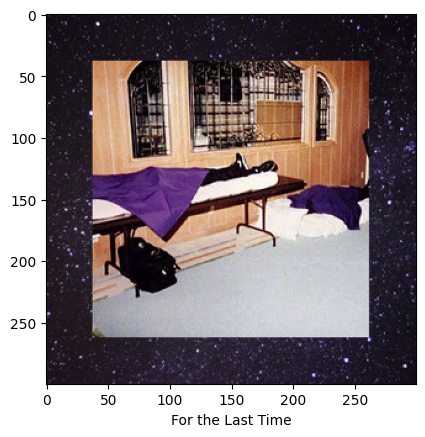

In [74]:
# fazendo o plot da imagem apos o processamento
plt.imshow(image)
plt.xlabel(name, fontsize = 10)
plt.show()

# Recomendador
    Fazer o processo para mais músicas, no caso aquelas músicas do data recomendacoes

In [75]:
recomendacoes

,0,1,artists_song,id,distancias
0,-0.826954,-2.939691,Ed Sheeran - Shape of You,7qiZfU4dY1lWllzX7mPBI3,0.000000
1,-0.831891,-2.941406,Juice WRLD - Hear Me Calling,13ZyrkCDmRz5xY3seuAWYk,0.005226
2,-0.826575,-2.915302,$uicideBoy$ - For the Last Time,240audWazVjwvwh7XwfSZE,0.024393
3,-0.863727,-2.965997,Marshmello - Be Kind (with Halsey),3Z8FwOEN59mRMxDCtb8N0A,0.045213
4,-0.792448,-2.974369,Joyner Lucas - Will - Remix,6WI33r2QRxyxttn3KH0XkC,0.048920
...,...,...,...,...,...
6475,3.793151,-1.332074,The Lumineers - Slow It Down,66nJBHV6WtQI3IiU6n8fY5,4.891810
6476,3.360840,-0.344879,Tyler Childers - Bottles and Bibles,2AEebJOZYwJOt4IZ9BGZR6,4.926527
6477,3.737567,-1.039834,"Mitski - Because Dreaming Costs Money, My Dear",2DWf9b143xSKlm7ZWn4nVP,4.944119
6478,4.356136,-2.228435,Daniel Caesar - Loose,59acp1OhcvxwVBwQJBYKuX,5.231664


#### Criando funcao para buscar os dados da playlist

In [76]:
def recommend_id(playlist_id):
    name = []
    url = []
    for i in playlist_id:
        track = sp.track(i)
        url.append(track['album']['images'][1]['url'])
        name.append(track['name'])
    return name, url

In [77]:
#  add more info to get from spotify API (https://developer.spotify.com/documentation/web-api/reference/#/operations/get-track)

# def recommend_id(playlist_id):
#     name = []
#     url = []
#     artists = []
#     duration = []
#     for i in playlist_id:
#         track = sp.track(i)
#         url.append(track['album']['images'][1]['url'])
#         name.append(track['name'])
#         artists.append(track['artists'][0]['name'])
#         duration.append(round(track["duration_ms"]/60000, 2))
#     return name, url, artists, duration

In [78]:
name, url = recommend_id(recomendacoes['id'].head(11))
name, url

(['Shape of You',
  'Hear Me Calling',
  'For the Last Time',
  'Be Kind (with Halsey)',
  'Will - Remix',
  'WRONG (feat. Lil Mosey)',
  'House Arrest Tingz',
  'Putrid Pride',
  'South of the Border (feat. Camila Cabello & Cardi B)',
  '1.5',
  'What It Is (feat. Chris Brown)'],
 ['https://i.scdn.co/image/ab67616d00001e02ba5db46f4b838ef6027e6f96',
  'https://i.scdn.co/image/ab67616d00001e02af149eb4002f65f83afc63c4',
  'https://i.scdn.co/image/ab67616d00001e02f795a2962820664b4112901e',
  'https://i.scdn.co/image/ab67616d00001e02fdf2e993e10e67396b3bf759',
  'https://i.scdn.co/image/ab67616d00001e024ac196312c24faedb76a345e',
  'https://i.scdn.co/image/ab67616d00001e02891f0552bed344dc2bfe322f',
  'https://i.scdn.co/image/ab67616d00001e028bd6e34012a7ab6311050d0c',
  'https://i.scdn.co/image/ab67616d00001e0207aa1426cb2b3cfd8ad67c64',
  'https://i.scdn.co/image/ab67616d00001e0273304ce0653c7758dd94b259',
  'https://i.scdn.co/image/ab67616d00001e02280689ecc5e4b2038bb5e4bd',
  'https://i.scdn.

#### Criando funcao para gerar as imagens da playlist

In [79]:
def visualize_songs(name, url):
    plt.figure(figsize=(16,10))
    columns = 5

    for i, u in enumerate(url):
        # ax como subplot, com a divisao que retonar inteiro do numero urls pelas colunas +1 (no caso, 6)
        ax = plt.subplot(len(url) // columns + 1, columns, i +1)
        image = io.imread(u)
        plt.imshow(image)
        # deixar o eixo Y invisivel
        ax.get_yaxis().set_visible(False)
        # define o local que vamos trocar os rotulos do eixo x e y, vamos deixar os pontos de marcacao brancos
        plt.xticks(color='w', fontsize = 0.1)
        plt.yticks(color='w', fontsize = 0.1)
        # nome da musica no eixo x
        plt.xlabel(name[i], fontsize = 8)
        # fazer com que todos os parametros se encaixem no tamnho da imagem definida.
        plt.tight_layout(h_pad=0.7, w_pad=0)
        # ajustar os parametros de layout da imagem
        plt.subplots_adjust(wspace=None, hspace=None)
        # remove  os ticks - marcadores do eixo x, sem remover o eixo todo, deixando o nome da musica
        plt.tick_params(bottom=False)
        # tirar a grade da imagem
        plt.grid(visible=None)
    return plt.show()

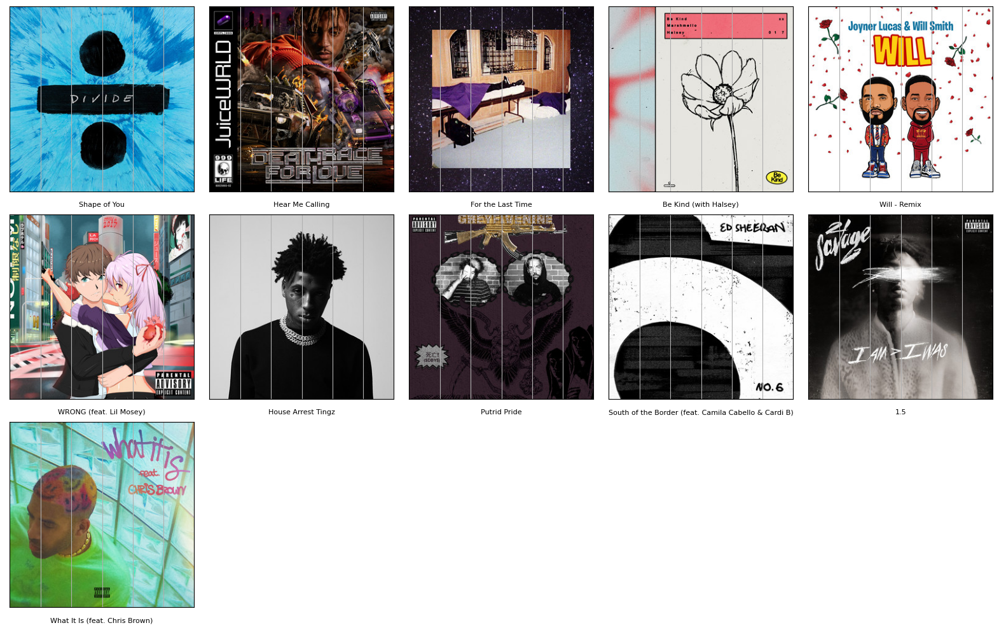

In [80]:
visualize_songs(name, url)

# Funcao Final

In [81]:
def recomendador_top10(nome_musica):
## Calculando as distancias
    cluster = list(projection_m[projection_m['artists_song'] == nome_musica]['cluster'])[0]
    x_musica = list(projection_m[projection_m['artists_song'] == nome_musica][0])[0] 
    y_musica = list(projection_m[projection_m['artists_song'] == nome_musica][1])[0] 
    musicas_recomendadas = projection_m[projection_m['cluster'] == cluster][[0,1, 'artists_song']]
    distancias = euclidean_distances(musicas_recomendadas[[0,1]], [[x_musica, y_musica]])
    musicas_recomendadas['id'] = df['id']
    musicas_recomendadas['distancias'] = distancias
    recomendacoes = musicas_recomendadas.sort_values(by='distancias').reset_index(drop=True)
## Acessando os dados de cada musica com a biblioteca Spotify (nome e imagem)
    playlist_id = recomendacoes['id'].head(10)
    url =[]
    name = []
    for i in playlist_id:
        track = sp.track(i)
        url.append(track['album']['images'][1]['url'])
        name.append(track['name'])

## Plot das figuras
    plt.figure(figsize=(16,10))
    columns = 5

    for i, u in enumerate(url):
        ax = plt.subplot(len(url) // columns + 1, columns, i +1)
        image = io.imread(u)
        plt.imshow(image)
        ax.get_yaxis().set_visible(False)
        plt.xticks(color='w', fontsize = 0.1)
        plt.yticks(color='w', fontsize = 0.1)
        plt.xlabel(name[i], fontsize = 8)
        plt.tight_layout(h_pad=0.7, w_pad=0)
        plt.subplots_adjust(wspace=None, hspace=None)
        plt.tick_params(bottom=False)
        plt.grid(visible=None)
    return plt.show()

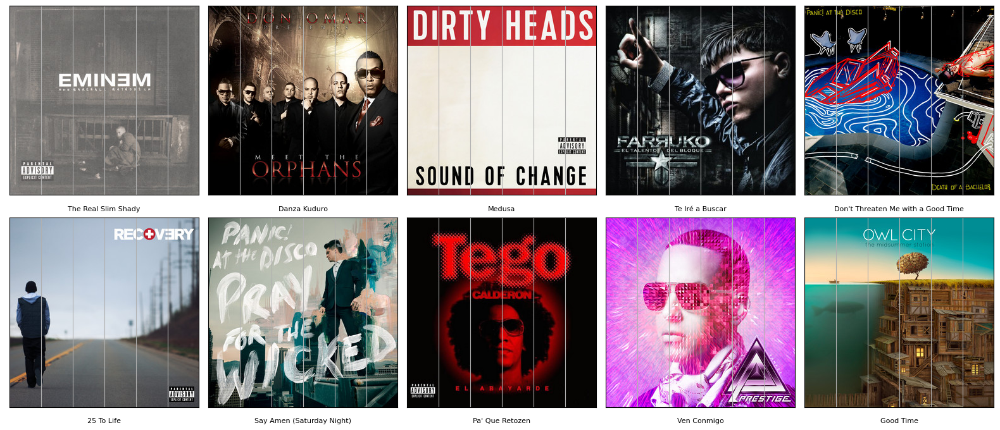

In [82]:
recomendador_top10('Eminem - The Real Slim Shady')